<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 15px; height: 80px">

# Capstone Project 

## AutoTel Shared Cars Availability

### Location history of shared cars


### Exploratory Data Analysis (EDA)

---


In order to reduce the number of owned cars, the city of Tel Aviv launched a shared-car project, called AutoTel. Users of the service are able to reserve a car using a mobile app, and pay for it by the minute. The project that was launched in October 2017 attracted over 7500 users, with more than 50% of them using the service at least once a week.


From the AutoTel website we extracted the location of the parked cars, every two minutes for several months. The raw data was saved to Google Storage in CSV format, and later loaded to a BigQuery Table. This short clip shows a visualization of the recorded data using Uber’s kepler.gl tool.

To select from the BQ table run:

select * from `gad-playground-212407.doit_intl_autotel_public.car_locations` LIMIT 1
Inspiration
In order for the service to be reliable, AutoTel has to make sure that supply and demand are geospatially balanced, meaning cars are where and when they are needed. This task is extremely difficult since cars are driven and parked by customers who are not aligned at all with this optimization task. For the most part, the distribution of cars is uncorrelated with the demand: one reason is that if a car is parked in a suburban neighborhood, it may take a long time before another user may drive it to the city center, where high demand for the cars exists; thus clusters of unused cars are very often present on the outskirts of the city.

Using machine learning, AutoTel can predict the geospatial availability of cars at given times, and use predictions to modify their business model. They could, for example, modify prices so that it would be cheaper to park cars in high demand areas, or plan the the maintenance program so that cars will be collected from high-supply-low-demand areas and returned to areas of high demand.

The data sources is: https://www.kaggle.com

---

The part 2,3 of capstone project is focused on exploratory data analysis, aka "EDA". EDA is an essential part of the data science analysis pipeline. Failure to perform EDA before modeling is almost guaranteed to lead to bad models and faulty conclusions.

#### Package imports

In [1]:
import numpy as np
import scipy.stats as stats
import csv
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os 
import warnings
warnings.filterwarnings

# this line tells jupyter notebook to put the plots in the notebook rather than saving them to file.
%matplotlib inline

# this line makes plots prettier on mac retina screens. If you don't have one it shouldn't do anything.
%config InlineBackend.figure_format = 'retina'



## 1. Load the `2020_02_25.csv` dataset and describe it

---

I got the `2020_02_25.csv` dataset from The data sources https://www.kaggle.com

In [2]:
df_cars = pd.read_csv('./2020_02_25.csv')

In [3]:
df_cars.head() 

,latitude,longitude,total_cars,cars_list,timestamp
0,32.09004,34.79679,1,[138],2020-02-25 10:48:02 UTC
1,32.11614,34.79464,1,[64],2020-02-25 10:48:02 UTC
2,32.11876,34.82229,1,[120],2020-02-25 10:48:02 UTC
3,32.11226,34.83799,1,[110],2020-02-25 10:48:02 UTC
4,32.14279,34.79343,1,[190],2020-02-25 10:48:02 UTC


In [4]:
df_cars.shape

(20049198, 5)

In [5]:
df_cars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20049198 entries, 0 to 20049197
Data columns (total 5 columns):
latitude      float64
longitude     float64
total_cars    int64
cars_list     object
timestamp     object
dtypes: float64(2), int64(1), object(2)
memory usage: 764.8+ MB


In [6]:
#df_sample = df_cars.sample(n=100000)
#df_sample.head()

In [7]:
#import numpy as np
#def num(x):
    
    #try:
        #return x[0]
    #except:
        #return np.nan
    

In [8]:
#df_sample.cars_list.apply(num)

In [9]:
#df_sample.sample(0.01)

Some of the rows indicate empty parking spots. These spots are reserved for AutoTel cars, but no car was parked there at the time. Since we are only interested in the cars location, we will filter these rows to save computation and memory

In [10]:
df_cars.describe()

,latitude,longitude,total_cars
count,2.004920e+07,2.004920e+07,2.004920e+07
mean,3.208399e+01,3.478932e+01,6.403020e-01
std,2.647921e-02,2.171547e-02,6.925362e-01
min,3.193745e+01,3.457867e+01,0.000000e+00
25%,3.206160e+01,3.477406e+01,0.000000e+00
50%,3.208211e+01,3.478686e+01,1.000000e+00
75%,3.210793e+01,3.480015e+01,1.000000e+00
max,3.217015e+01,3.503582e+01,2.600000e+01


In [11]:
# we can filter the unwanted rows 

df = df_cars[df_cars['total_cars'] > 0]

In [12]:
# the shape of data frame show us half of rows filtered out
# we can save computation and memory by this way
df.shape

(10778639, 5)

In [13]:
# Group by aggregate by one or more columns in pandas
# The example of to group on one or multiple columns and summarise data with aggregation function using Pandas.
# The source from https://jamesrledoux.com/code/group-by-aggregate-pandas

Pandas comes with a whole host of sql-like aggregation functions we can apply when grouping on one or more columns. This is Python’s closest equivalent to dplyr’s group_by + summarise logic. Here’s a quick example of how to group on one or multiple columns and summarise data with aggregation functions using Pandas.

In [14]:
# reset index to get grouped column

df_cars_by_time = df.groupby('timestamp').agg({'total_cars': 'sum'}
                                          ).reset_index()
df_cars_by_time.head()

,timestamp,total_cars
0,2018-07-04 00:04:24 UTC,221
1,2018-07-04 00:09:26 UTC,221
2,2018-07-04 00:14:28 UTC,225
3,2018-07-04 00:19:30 UTC,227
4,2018-07-04 00:24:33 UTC,229


In [15]:
#Create a datetime index


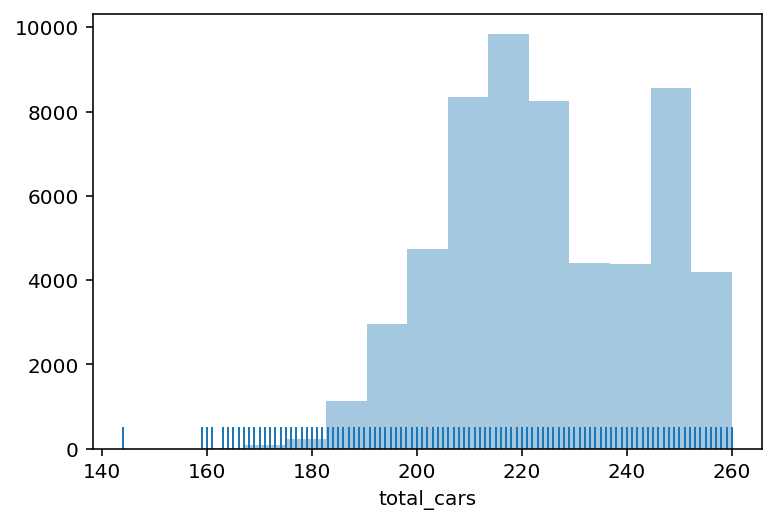

In [16]:
# kde: bool, optional - Whether to plot a gaussian kernel density estimate.
# bins: argument for matplotlib hist(), or None, optional - Specification of hist bins. If unspecified, as reference rule is used that tries to find a useful default.
# rug: bool, optional - Whether to draw a rugplot on the support axis.
import seaborn as sns, numpy as np

scores_dist1 = sns.distplot(df_cars_by_time.total_cars, bins=15, kde=False, rug=True )


# 2. Analyzing time series by Timestamp

In [17]:
#Time series analysis
# I need more practice for time serice 



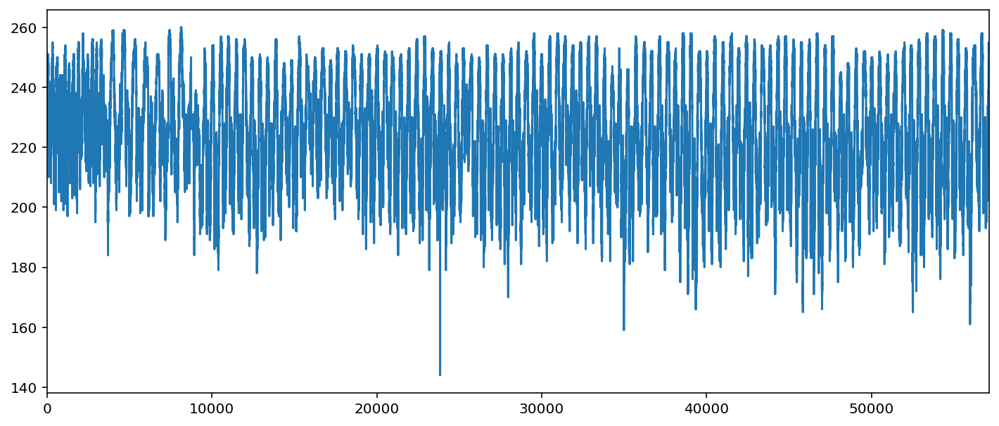

In [18]:
df_cars_by_time['total_cars'].plot(lw=1.5, figsize=(12,5))

In [19]:
df_cars_by_time['timestamp'] = df_cars_by_time['timestamp'].apply(pd.Timestamp)
rolling_mean = df_cars_by_time.set_index('timestamp').sort_index().rolling(window=2, center=True).mean()
exp_mean = df_cars_by_time.set_index('timestamp').sort_index().ewm(span=10).mean()

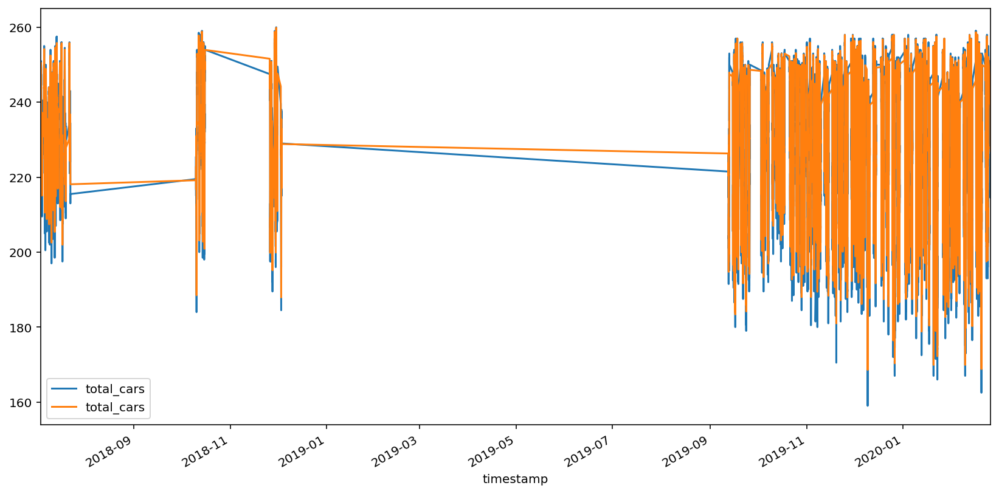

In [20]:
ax = rolling_mean.plot(lw=1.5, figsize=(14,7))
exp_mean.plot(ax=ax, lw=1.5)


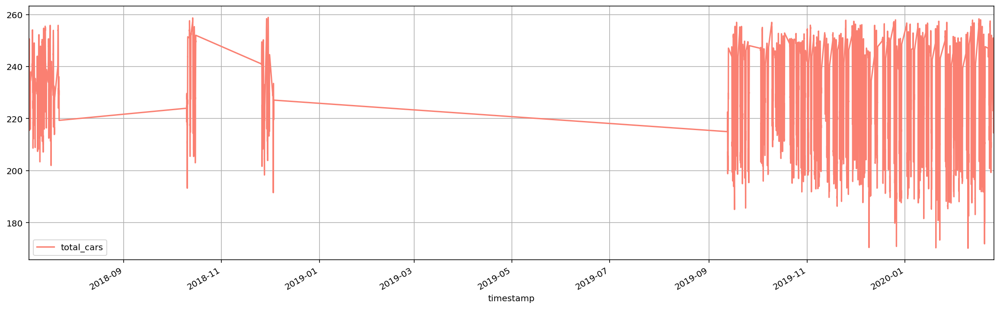

In [21]:
#the rolling mean is the mean of a moving window across the time periods.
#Pandas has a lot of functionality to create rolling statistics which we will only scratch the surface of
#There is a rolling() function that has the statistical function chained to it
#Extract the dates from the index as timestamps.
#the .to_timestamp() function lets you extract the timestamps.


df_cars_by_time['timestamp'] = df_cars_by_time['timestamp'].apply(pd.Timestamp)
df_cars_by_time.set_index('timestamp').sort_index().rolling('60min').mean().plot(figsize=(20,6), c='salmon', lw=1.6)
plt.grid()
plt.show()


In [22]:
# We can see that tge max available cars is 260, so we can assume that this is the total number of cars available in AutoTel

# By assuming this we will calculate the usage rate.



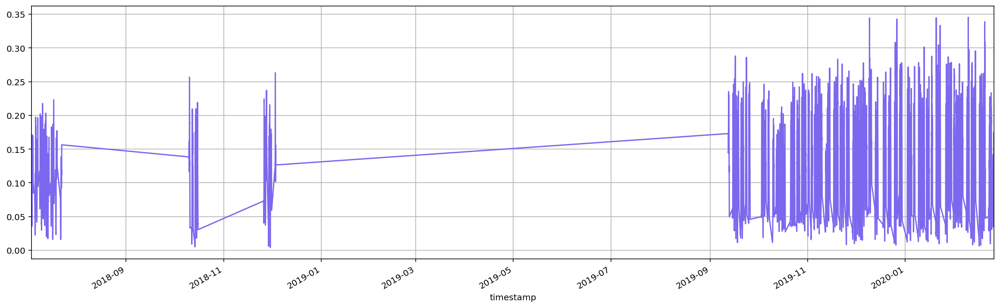

In [23]:
df_cars_by_time['usage_rate'] = (260 - df_cars_by_time['total_cars'])/260
usage_rate = df_cars_by_time.set_index('timestamp').sort_index()['usage_rate'].rolling('60min').mean()
usage_rate.plot(figsize=(20,6), c='mediumslateblue', lw=1.5)
plt.grid()
plt.show()

In [24]:
# usage growing or decreasing over time

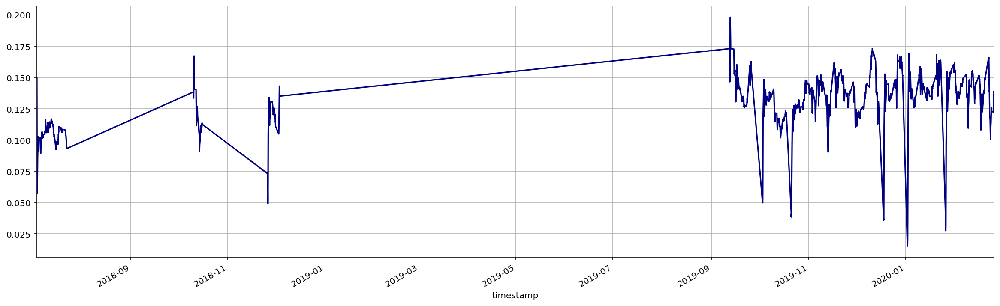

In [25]:
df_cars_by_time['usage_rate'] = (260 - df_cars_by_time['total_cars'])/260
df_cars_by_time.set_index('timestamp').sort_index()['usage_rate'].rolling('3D').mean().plot(figsize=(20,6), c='navy', lw=1.6)
plt.grid()
plt.show()

# 3. Analyzing Usage Patterns by Time

In [26]:
# In order to analyze the data by time we need to consider the time zone,  
# Tel Aviv is not in UTC timezone. 
# We will converted the capital city time zone as same time zone

In [27]:
# convert timezone

timestamps = pd.DatetimeIndex(df_cars_by_time['timestamp'])
timestamps = timestamps.tz_convert('Asia/Jerusalem')

df_cars_by_time['Local_time'] = timestamps

# extract time features
df_cars_by_time['weekday'] = df_cars_by_time['Local_time'].dt.weekday_name
df_cars_by_time['hour'] = df_cars_by_time['Local_time'].dt.hour

In [28]:
df_cars_by_time.head()

,timestamp,total_cars,usage_rate,Local_time,weekday,hour
0,2018-07-04 00:04:24+00:00,221,0.150000,2018-07-04 03:04:24+03:00,Wednesday,3
1,2018-07-04 00:09:26+00:00,221,0.150000,2018-07-04 03:09:26+03:00,Wednesday,3
2,2018-07-04 00:14:28+00:00,225,0.134615,2018-07-04 03:14:28+03:00,Wednesday,3
3,2018-07-04 00:19:30+00:00,227,0.126923,2018-07-04 03:19:30+03:00,Wednesday,3
4,2018-07-04 00:24:33+00:00,229,0.119231,2018-07-04 03:24:33+03:00,Wednesday,3


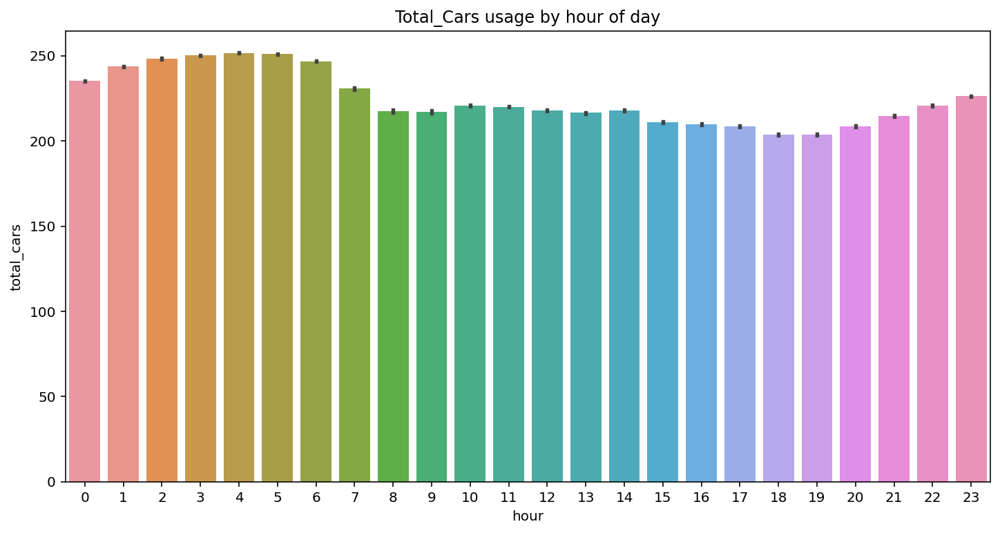

In [29]:
# Analyze usage and viselize by hour

plt.figure(figsize=(12,6))
#plt.subplot(121)
sns.barplot(x='hour', y='total_cars', data=df_cars_by_time)
plt.title('Total_Cars usage by hour of day')

plt.show()

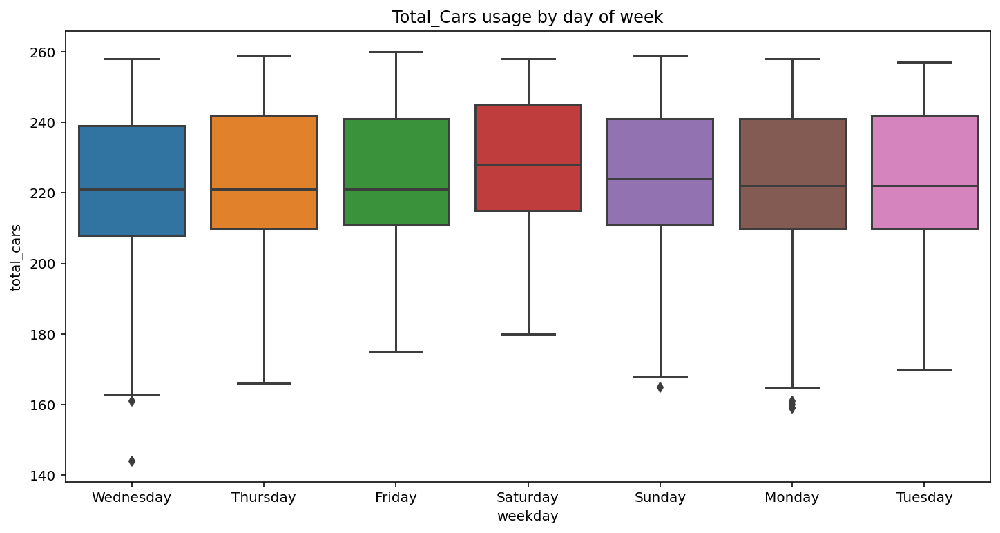

In [30]:
# Analyze usage and viselize by day
plt.figure(figsize=(12,6))
#plt.subplot(122)
sns.boxplot(x='weekday', y='total_cars', data=df_cars_by_time) #showfliers=False
plt.title('Total_Cars usage by day of week')

plt.show()

In [31]:
#We can see that tge max available cars is 260, 
#so we can assume that this is the total number of cars available in AutoTel.
#By assuming this we will calculate the usage rate.

df_cars_by_time['usage_rate'] = (260 - df_cars_by_time['total_cars'])/260

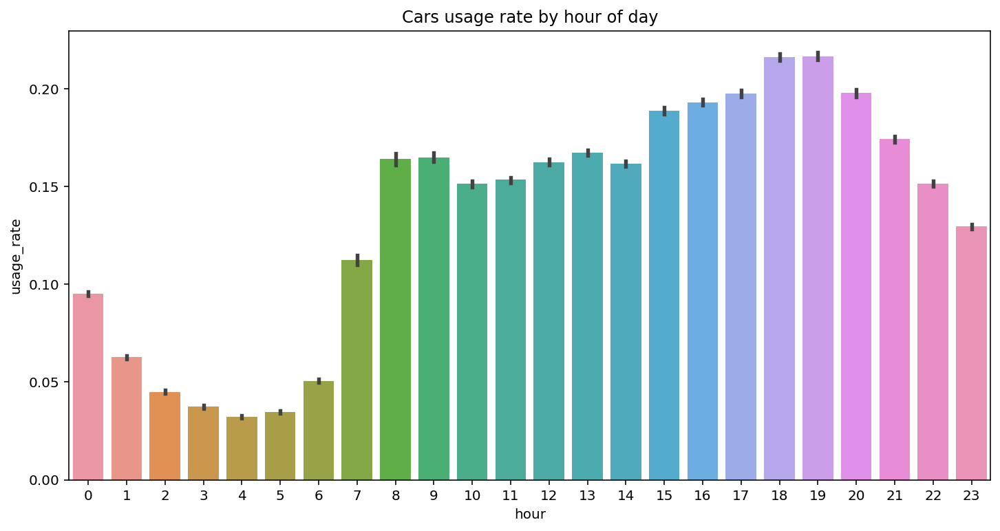

In [32]:
plt.figure(figsize=(12,6))
#plt.subplot(121)
sns.barplot(x='hour', y='usage_rate', data=df_cars_by_time)
plt.title('Cars usage rate by hour of day')

plt.show()

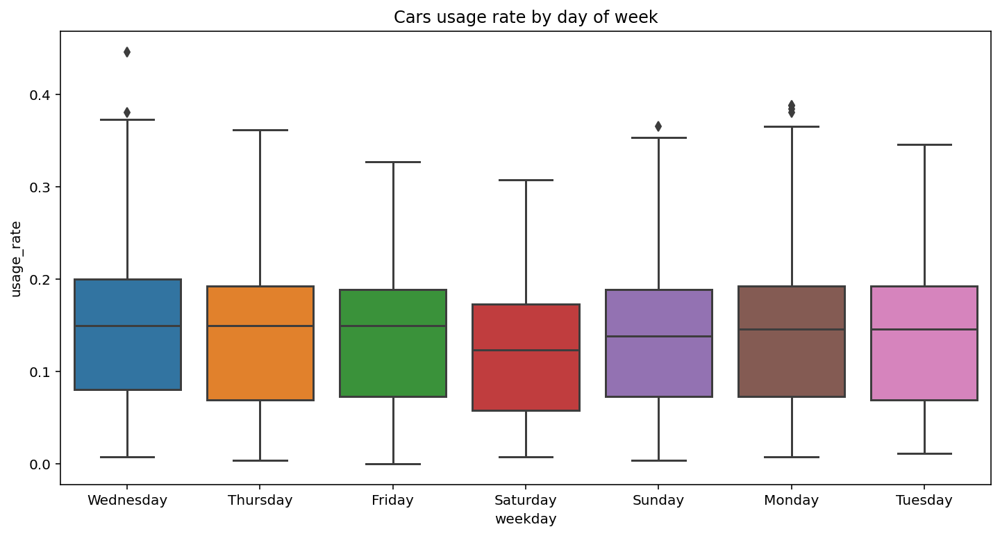

In [33]:
# Analyze usage and viselize by day
plt.figure(figsize=(12,6))
#plt.subplot(122)
sns.boxplot(x='weekday', y='usage_rate', data=df_cars_by_time) #showfliers=False
plt.title('Cars usage rate by day of week')

plt.show()

.    Looks much better isn't it? during the night the usage drops to as much as 2.5%, while at peak times almost 20% of the cars are in use.

.    Weekdays in israel are Sunday to Thursday, the weekend is Friday and Saturday. This may explain why Thursday has the highest usage rate on average

### Plotting the data on a map

This geographical data can be presented on a map, showing where people park the cars

In [34]:
# Create interactive maps with the folium package
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

In [35]:
#Along the way, I'll apply my new skills to visualize AutoTel data.
#We add some data to the map, Location sets the map

df_locations = df.groupby(['latitude', 'longitude', 'timestamp']).sum().reset_index().sample(1500)
df_locations.head()

,latitude,longitude,timestamp,total_cars
10600335,32.13850,34.79196,2018-12-03 11:27:03 UTC,1
8247884,32.11449,34.79906,2020-02-02 21:39:02 UTC,1
25001,32.03116,34.74674,2018-10-12 12:19:35 UTC,1
8570011,32.11654,34.82381,2020-02-02 23:09:03 UTC,1
3376618,32.06119,34.78355,2018-07-12 18:09:15 UTC,1


In [36]:
# create a map with folium.Map()
m = folium.Map([df_locations.latitude.mean(), df_locations.longitude.mean()], zoom_start=11)
for index, row in df_locations.iterrows(): # Add points to the map
    Marker([row['latitude'], row['longitude']], radius=row['total_cars']*6, fill_color="#3db7e4").add_to(m)
    
points = df_locations[['latitude', 'longitude']].as_matrix()
m.add_children(HeatMap(points, radius=15)) #plot heatmap

#Display the map
m

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  import sys


### Predicting the number of available cars per neighborhood 

I can get the AutoTel provide additional data of neighborhood polygons of the city of Tel Aviv. This data will enable us to group the data by neighborhood and later predict the number of aviliable cars per neighborhood!
    
    . Disclaimer: Kaggle Kernels do not support GeoPandas, so I implemented my own geo joins wich are not efficient. Hopefully they will add it soon!

In [37]:
#Import necessary geometric objects from shapely module
#wkt stands for Well-Known Text and is a text markup language for representing vector geometry objects on a map,
#wkt spatial reference systems of spatial objects and transformations between spatial reference systems.
from shapely.geometry import Point, Polygon
from shapely import wkt

In [38]:
# load neiborhood data 

In [39]:
df_neighborhood = pd.read_csv('./tel_aviv_neighborhood.csv')
df_neighborhood.head()

,oid_shchuna,neighborhood_id,neighborhood_name,date_import,Shape_Area,area_polygon
0,1,3,Sde Dov area,2015-10-06 08:36:43 UTC,1.307955e+06,"POLYGON ((34.788389 32.123656, 34.788383 32.12..."
1,2,2,Spring Cliffs,2015-10-06 08:36:43 UTC,1.288925e+06,"POLYGON ((34.796243 32.130388, 34.795859 32.12..."
2,3,7,Ramat Aviv c,2015-10-06 08:36:43 UTC,1.101582e+06,"POLYGON ((34.808554 32.128712, 34.808641 32.12..."
3,4,11,Tel aviv university,2015-10-06 08:36:43 UTC,1.459851e+06,"POLYGON ((34.802354 32.118062, 34.80239 32.118..."
4,5,6,North Star,2015-10-06 08:36:43 UTC,4.212298e+05,"POLYGON ((34.783522 32.098636, 34.783493 32.09..."


In [40]:
def load_and_close_polygon(wkt_text):
    poly = wkt.loads(wkt_text)
    point_list = poly.exterior.coords[:]
    point_list.append(point_list[0])
    
    return Polygon(point_list)

In [41]:
# Lets transform the WKS's to Polygon Objects and save it to a GeoPandas DataFrame
df_neighborhood['polygon'] = df_neighborhood['area_polygon'].apply(load_and_close_polygon)
neighborhood_map = df_neighborhood.set_index('neighborhood_name')['polygon'].to_dict()

In [42]:
#Use sample(10000) data from original data
#have many points and just one polygon and I try to find out which one of them is inside the polygon
#need to iterate over the points and check one at a time if it is within() the polygon specified
#if have many polygons and just one point and you want to find out which polygon contains the point
#need to iterate over the polygons until you find a polygon that contains() 
#the point specified (assuming there are no overlapping polygons)
sample_df = df.sample(10000)
sample_df['points'] = sample_df.apply(lambda row : Point([row['longitude'], row['latitude']]), axis=1)
sample_df.head()

,latitude,longitude,total_cars,cars_list,timestamp,points
10855368,32.043770,34.758630,1,[92],2019-10-04 10:09:02 UTC,POINT (34.75863 32.04377)
6569717,32.034500,34.752980,1,[63],2020-02-03 16:48:03 UTC,POINT (34.75298 32.0345)
18012071,32.069981,34.763805,2,"[188, 120]",2019-09-18 09:09:02 UTC,POINT (34.763805 32.069981)
14282093,32.045230,34.755770,1,[199],2018-07-22 15:12:37 UTC,POINT (34.75577 32.04523)
18134088,32.117050,34.789230,1,[45],2019-09-15 18:00:03 UTC,POINT (34.78923 32.11705)


In [43]:
#add the neighborhood column

poly_idxs = sample_df['points'].apply(lambda point : np.argmax([point.within(polygon) 
                                                                  for polygon in list(neighborhood_map.values())]))

#In order to put points on the map, we need to convert each coordinate to geopoint, same for the dataframe.
#keys() method in Python Dictionary, returns a view object that displays a list of all the keys in the dictionary.
poly_idxs = poly_idxs.apply(lambda x: list(neighborhood_map.keys())[x])
sample_df['neighborhood'] = poly_idxs.values
sample_df.head()

,latitude,longitude,total_cars,cars_list,timestamp,points,neighborhood
10855368,32.043770,34.758630,1,[92],2019-10-04 10:09:02 UTC,POINT (34.75863 32.04377),Jaffa College Tel Aviv and Dakar
6569717,32.034500,34.752980,1,[63],2020-02-03 16:48:03 UTC,POINT (34.75298 32.0345),Jaffa D
18012071,32.069981,34.763805,2,"[188, 120]",2019-09-18 09:09:02 UTC,POINT (34.763805 32.069981),The Yemenite Vineyard
14282093,32.045230,34.755770,1,[199],2018-07-22 15:12:37 UTC,POINT (34.75577 32.04523),Tzahalon and savings settlements
18134088,32.117050,34.789230,1,[45],2019-09-15 18:00:03 UTC,POINT (34.78923 32.11705),Sea views


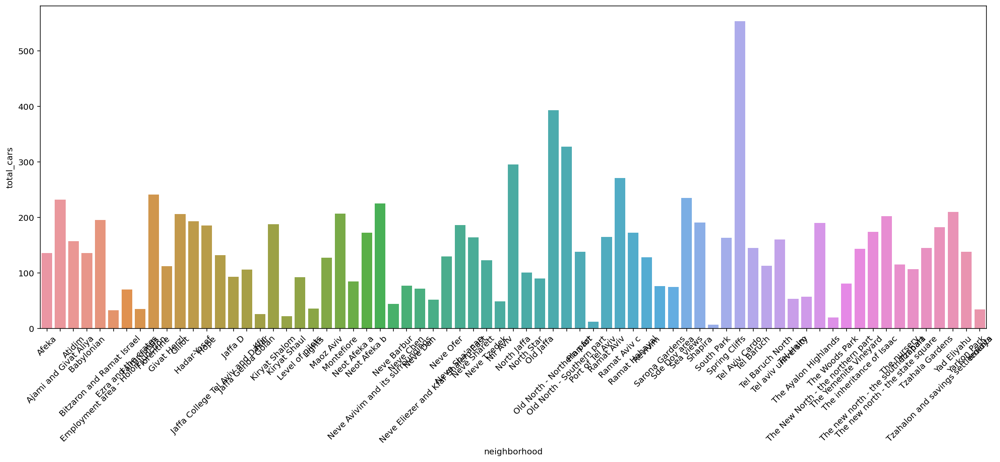

In [44]:
plt.figure(figsize=(20,7))
sns.barplot(x = 'neighborhood', y = 'total_cars', data=sample_df.groupby('neighborhood').count().reset_index())
plt.xticks(rotation=45)
plt.show()


In [45]:
#sat['geome']

### Predicting Car Availability using Models

In [46]:
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LogisticRegressionCV, LassoCV, Lasso, LinearRegression, RidgeCV, Ridge, ElasticNetCV, ElasticNet, BayesianRidge, OrthogonalMatchingPursuit
from sklearn import metrics
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.model_selection import StratifiedKFold
import sklearn.linear_model as linear_model
import seaborn as sns
import sklearn.metrics as metrics

In [47]:
#Make a copy of this object’s indices and data.
#A shallow copy constructs a new compound object 
#and then (to the extent possible) inserts references into it to the objects found in the original.
df_sample = df.copy()

In [48]:
df_timestaps = pd.DataFrame()

#Pandas drop_duplicates() method helps in removing duplicates from the data frame.
df_timestaps['timestamp'] = df_sample.timestamp.drop_duplicates()

#Manipulating and converting date times with timezone information
#A timezone that has a variable offset from UTC.
#Localize tz-naive DatetimeIndex to a given time zone, or remove timezone from a tz-aware DatetimeIndex.
#timestamps = pd.DatetimeIndex(df_timestaps['timestamp']).tz_localize('UTC')

#Time zone for time. 
#Corresponding timestamps would be converted to this time zone of the Datetime Array/Index. 
#A tz of None will convert to UTC and remove the timezone information.
df_timestaps['Local_time'] = timestamps.tz_convert('Asia/Jerusalem')


In [49]:
#The join is done on columns, the DataFrame indexes will be ignored.
#left: use only keys from left frame
df_sample = df_sample.merge(df_timestaps, on='timestamp', how='left')

In [50]:
# Again no reason to calculate on duplicate points, it's very expensive!
#Creating a GeoDataFrame from a DataFrame with coordinates
df_points = df_sample[['longitude', 'latitude']].drop_duplicates()

#consider a DataFrame containing cities and their respective longitudes and latitudes
df_points['points'] = df_points.apply(lambda row : Point([row['longitude'], row['latitude']]), axis=1)

#have many points and just one polygon and try to find out which one of them is inside the polygon
#need to iterate over the points and check one at a time if it is within() the polygon specified
#if have many polygons and just one point and you want to find out which polygon contains the point
#need to iterate over the polygons until you find a polygon that contains() 
#the point specified (assuming there are no overlapping polygons)
poly_idxs = df_points['points'].apply(lambda point : np.argmax([point.within(polygon) 
                                                                for polygon in list(neighborhood_map.values())]))

#In order to put points on the map, we need to convert each coordinate to geopoint, same for the dataframe.
#keys() method in Python Dictionary, returns a view object that displays a list of all the keys in the dictionary.
poly_idxs = poly_idxs.apply(lambda x: list(neighborhood_map.keys())[x])
df_points['neighborhood'] = poly_idxs.values


In [51]:
#The join is done on columns, the DataFrame indexes will be ignored.
#left: use only keys from left frame
df_sample = df_sample.merge(df_points[['longitude', 'latitude', 'neighborhood']], 
                            on=['longitude', 'latitude'], how='left')

In [52]:
#Timestamp is just unix time with nanoseconds (so divide it by 10**6)
df_sample['time_in_seconds'] = pd.to_datetime(df_sample['Local_time']).values.astype(np.int64) // 10**6

#Generate n rows of random 24-hour times (seconds past midnight)
seconds_in_day = 24 * 60 * 60
seconds_in_week = 7 * seconds_in_day

#the two-feature transformation in 2D as a 24-hour clock. 
#The distance between two points corresponds to the difference in time as we expect from a 24-hour cycle.
#we will create two new features, deriving a sine transform and cosine transform of the seconds-past-midnight feature. 
#df_sample['sin_time_day'] = np.sin(2*np.pi*df_sample['time_in_seconds']/seconds_in_day)
#df_sample['cos_time_day'] = np.cos(2*np.pi*df_sample['time_in_seconds']/seconds_in_day)
#This gives you a cyclical embedding of the datetime component. 
#Thus, (e.g.) midnight and 1 am will have a similar representation
#df_sample['sin_time_week'] = np.sin(2*np.pi*df_sample['time_in_seconds']/seconds_in_week)
#df_sample['cos_time_week'] = np.cos(2*np.pi*df_sample['time_in_seconds']/seconds_in_week)
#We can feed the sin_time and cos_time features into our machine learning model, 
#and the cyclical nature of 24-hour time will carry over.

df_sample['weekday'] = df_sample['Local_time'].dt.weekday
df_sample['hour'] = df_sample['Local_time'].dt.hour

df_sample.sample(5)

,latitude,longitude,total_cars,cars_list,timestamp,Local_time,neighborhood,time_in_seconds,weekday,hour
2501167,32.043990,34.803270,1,[89],2019-12-07 13:48:02 UTC,2019-09-25 18:48:02+03:00,Yedidya,1569426482000,2,18
4417036,32.113800,34.841800,1,[57],2020-02-12 19:03:02 UTC,2019-11-04 01:03:03+02:00,Atidim,1572822183000,0,1
3533427,32.073687,34.765448,1,[149],2020-02-03 12:21:03 UTC,2019-10-21 04:06:02+03:00,Tel Aviv Cardo,1571619962000,0,4
8143777,32.055900,34.805970,1,[246],2018-10-14 04:31:01 UTC,2020-01-10 20:00:02+02:00,Lights,1578679202000,4,20
1281149,32.120740,34.822070,1,[170],2019-09-16 02:15:02 UTC,2018-11-27 03:29:18+02:00,Neot Afeka b,1543282158000,1,3


### Does our data contain multiple parking spots per Neighborhood?

i.e multiple rounded latLongs per neighborhood?

We may want to roundup the latlongs , in case reporting comes from the car level, rather than the parking spot(s)

In [53]:
df_sample[['longitude', 'latitude', 'neighborhood']].groupby('neighborhood').nunique()

,longitude,latitude,neighborhood
neighborhood,,,
Afeka,591,586,1
Ajami and Givat Aliya,741,1168,1
Atidim,333,331,1
Babylonian,631,656,1
Bitzaron and Ramat Israel,814,670,1
...,...,...,...
Tzahala Gardens,681,622,1
Tzahalon and savings settlements,676,926,1
Yad Eliyahu,1179,912,1


In [54]:
#Round a DataFrame to a variable number of decimal places.
#By providing an integer each column is rounded to the same number of decimal places
df_sample["LL2"] = df_sample['longitude'].round(2).astype(str) + df_sample['latitude'].round(2).astype(str)

df_sample[['LL2', 'neighborhood']].groupby('neighborhood').nunique()

,LL2,neighborhood
neighborhood,,
Afeka,2,1
Ajami and Givat Aliya,5,1
Atidim,3,1
Babylonian,4,1
Bitzaron and Ramat Israel,4,1
...,...,...
Tzahala Gardens,3,1
Tzahalon and savings settlements,4,1
Yad Eliyahu,4,1


We see that looking at the "parking lot" level would mean roughly Tripling + the amount of rows/samples in our data to predict on. This might be a bit too much, although it would be more relevant for the level of taking action, i.e "where are there missing cars + a demand for cars"

### Back to merging + aggregation by Neighborhood:

Changed : we will look at the hourly level, not minute level. (Could also do every half hour maybe?)

Alternative target: Per "parking lot" = by LatLong2 LL2

In [86]:
# aggregation by Neighbourhood
aggs = {}
aggs['total_cars'] = 'sum'
#aggs['sin_time_day'] = 'mean'
#aggs['cos_time_day'] = 'mean'
#aggs['sin_time_week'] = 'mean'
#aggs['cos_time_week'] = 'mean'
aggs['weekday'] = 'first'
aggs['hour'] = 'first'
# Mode is problematic with agg
aggs['latitude'] =   'first' # pd.Series.mode()#lambda x: x.mode #pd.Series.mode()#
aggs['longitude'] =  'first' # pd.Series.mode() #lambda x: x.mode #pd.Series.mode() # 'first'

# 30 minute resample
df_sample = df_sample.set_index('Local_time').groupby([pd.Grouper(freq='1800s'), 
                                                       'neighborhood']).agg(aggs).reset_index()

# df_sample.set_index('local_time').groupby([pd.Grouper(freq='60s'), 'neighborhood']).agg(aggs).reset_index().tail()

print(df_sample.shape)

df_sample.tail()

(389981, 7)


,Local_time,neighborhood,total_cars,weekday,hour,latitude,longitude
389976,2020-02-25 12:30:00+02:00,Tzahala,1,1,12,32.124020,34.838930
389977,2020-02-25 12:30:00+02:00,Tzahala Gardens,4,1,12,32.120370,34.828160
389978,2020-02-25 12:30:00+02:00,Tzahalon and savings settlements,7,1,12,32.047110,34.755540
389979,2020-02-25 12:30:00+02:00,Yad Eliyahu,6,1,12,32.058330,34.795340
389980,2020-02-25 12:30:00+02:00,Yarkon Park,3,1,12,32.106567,34.832598


In [87]:
sample = df_sample.tail(1500)

In [94]:
#sample.to_csv(r'http://localhost:8888/notebooks/Documents/DsiPlus10/Capstone%20Project/export_data.csv')
sample.to_csv(r'http://localhost:8888/tree/Documents/DsiPlus10/Capstone%20Project/export_dataframe.csv', index=False)

TypeError: a bytes-like object is required, not 'str'

# Train a Model

## Classification

In [56]:
import pandas as pd 
import numpy as np
from sklearn.datasets import load_breast_cancer

from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier

from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, ExtraTreesRegressor

from sklearn.model_selection  import train_test_split, GridSearchCV, cross_val_score

from sklearn.metrics import confusion_matrix, recall_score, classification_report

from sklearn.metrics import confusion_matrix, recall_score, accuracy_score

import matplotlib.pyplot as plt

import seaborn as sns

%matplotlib

Using matplotlib backend: MacOSX


### Data Preparation

In [57]:
#Convert to categorical type
df_sample['neighborhood'] = df_sample['neighborhood'].astype('category')
df_sample['weekday'] = df_sample['weekday'].astype('category')
df_sample['hour'] = df_sample['hour'].astype('category')

# if there haven't label column we can ceate the lable as blow:
median_total_cars = df_sample['total_cars'].median()
#y is a category that the mapping function predicts
#create lables from salary
df_sample['total_cars_label'] = df_sample['total_cars'].apply(lambda x: 1 if x > median_total_cars else 0)

df_sample['total_cars_label'].value_counts()

0    195778
1    194203
Name: total_cars_label, dtype: int64

In [58]:
# define X and y

X = df_sample[['neighborhood', 'weekday', 'hour']]
y = df_sample['total_cars_label']

In [59]:
X_dummy = pd.get_dummies(X, drop_first=True)
print (X_dummy.shape)

(389981, 99)


### Ensamble Methodes

#### Baseline Accuracy

In [60]:
max(df_sample['total_cars_label'].value_counts(normalize=True))*100

50.201932914680455

#### Data train and test

In [61]:
X_train, X_test, y_train, y_test = train_test_split(X_dummy, y, test_size=0.33, 
                                                    random_state=42, stratify = y)

In [62]:
y_test.mean()

0.49797970379349465

In [63]:
y_train.mean()

0.4979811471676739

### Decision Tree Model

In [64]:
dt = DecisionTreeClassifier()

In [65]:
cross_val_score(dt, X_train, y_train, cv=10)

array([0.72666386, 0.72704658, 0.72731448, 0.72716139, 0.72834781,
       0.72387003, 0.72612806, 0.72615585, 0.7276485 , 0.72500765])

In [66]:
dt.fit(X_train, y_train)

DecisionTreeClassifier()

In [67]:
dt.score(X_train, y_train)

0.7503320103947001

In [68]:
dt.score(X_test, y_test)

0.72831678244518

In [83]:
from io import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()  

export_graphviz(dt, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png()) 

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.148744 to fit



In [70]:
from sklearn.metrics import classification_report

dt_predict = dt.predict(X_test)

print (classification_report(y_test, dt_predict))

              precision    recall  f1-score   support

           0       0.74      0.71      0.72     64607
           1       0.72      0.75      0.73     64087

    accuracy                           0.73    128694
   macro avg       0.73      0.73      0.73    128694
weighted avg       0.73      0.73      0.73    128694



### Bootstrap with Pandas

In [71]:
X_sample = X_train.sample(replace=True, n=X_train.shape[0], random_state=42)
y_sample = y_train[X_sample.index]

In [72]:
bt_tree = DecisionTreeClassifier()
bt_tree.fit(X_sample, y_sample)
bt_tree.score(X_test, y_test)

0.7157287830046467

In [73]:
bt_predict = bt_tree.predict(X_test)
print(classification_report(y_test, bt_predict))

              precision    recall  f1-score   support

           0       0.72      0.70      0.71     64607
           1       0.71      0.73      0.72     64087

    accuracy                           0.72    128694
   macro avg       0.72      0.72      0.72    128694
weighted avg       0.72      0.72      0.72    128694



### Bagging Classifier

In [74]:
bag = BaggingClassifier(n_estimators=10)

bag.fit(X_train, y_train)
bag_predict = bag.predict(X_test)
bag.score(X_test, y_test)

0.7272133899016271

In [75]:
print(classification_report(y_test, bag_predict))

              precision    recall  f1-score   support

           0       0.74      0.69      0.72     64607
           1       0.71      0.76      0.74     64087

    accuracy                           0.73    128694
   macro avg       0.73      0.73      0.73    128694
weighted avg       0.73      0.73      0.73    128694



### Random ForestClassification

In [76]:
# Run RandomForestClassifier
from sklearn.metrics import confusion_matrix, recall_score, accuracy_score

rfc = RandomForestClassifier(random_state=1000)
rfc.fit(X_train, y_train)
rfc_predict = rfc.predict(X_test)
accuracy_score(y_test, rfc_predict)

0.7288529379769064

In [77]:
print(classification_report(y_test, rfc_predict))

              precision    recall  f1-score   support

           0       0.74      0.70      0.72     64607
           1       0.71      0.76      0.74     64087

    accuracy                           0.73    128694
   macro avg       0.73      0.73      0.73    128694
weighted avg       0.73      0.73      0.73    128694



### Predicting Car Availability using LightGBM

Now lets imagine that we'd like to generate predictions to how cars will be distributed between neighborhoods in the city. So in this sample code we will try to use LightGBM to predict the number of avilable car in a neighborhood 

In [78]:
#pip install setuptools numpy scipy scikit-learn -U

In [79]:
#conda install -c conda-forge lightgbm
#conda install -c conda-forge/label/cf201901 lightgbm
#conda install -c conda-forge/label/cf202003 lightgbm

In [80]:
import lightgbm as lgb
import numpy as np

ModuleNotFoundError: No module named 'lightgbm'

### I use kaggle noteboor Predicting Car Availability using LightGBM

In [ ]:
#Make a copy of this object’s indices and data.
#A shallow copy constructs a new compound object 
#and then (to the extent possible) inserts references into it to the objects found in the original.
df_sample = df.copy()

In [ ]:
df_timestaps = pd.DataFrame()

#Pandas drop_duplicates() method helps in removing duplicates from the data frame.
df_timestaps['timestamp'] = df_sample.timestamp.drop_duplicates()

#Time zone for time. 
#Corresponding timestamps would be converted to this time zone of the Datetime Array/Index. 
#A tz of None will convert to UTC and remove the timezone information.
df_timestaps['Local_time'] = timestamps.tz_convert('Asia/Jerusalem')

In [ ]:
#The join is done on columns, the DataFrame indexes will be ignored.
#left: use only keys from left frame
df_sample = df_sample.merge(df_timestamps, on='timestamp', how='left')

In [ ]:
# Again no reason to calculate on duplocate points, it's very expensive!
#Creating a GeoDataFrame from a DataFrame with coordinates
df_points = df_sample[['longitude','latitude']].drop_duplicates()

#consider a DataFrame containing cities and their respective longitudes and latitudes
df_points['points'] = df_points.apply(lambda row : Point([row['longitude'], row['latitude']]), axis=1)

#the point specified (assuming there are no overlapping polygons)
poly_idxs = df_points['points'].apply(lambda point : np.argmax([point.within(polygon) for polygon in 
                                                                list(neighborhood_map.values())]))
#In order to put points on the map, we need to convert each coordinate to geopoint, same for the dataframe.
#keys() method in Python Dictionary, returns a view object that displays a list of all the keys in the dictionary.
poly_idxs = poly_idxs.apply(lambda x: list(neighborhood_map.keys())[x])
df_points['neighborhood'] = poly_idxs.values

In [ ]:
#The join is done on columns, the DataFrame indexes will be ignored.
#left: use only keys from left frame
df_sample = df_sample.merge(df_points[['longitude', 'latitude', 'neighborhood']], 
                            on=['longitude', 'latitude'], how='left')


In [93]:
#seconds_in_day = 24 * 60 * 60
#seconds_in_week = 7 * seconds_in_day
df_sample['weekday'] = df_sample['Local_time'].dt.weekday
df_sample['hour'] = df_sample['Local_time'].dt.hour

print(df_sample.shape)
df_sample.head()

(2049770, 7)


,Local_time,neighborhood,total_cars,weekday,hour,latitude,longitude
0,2018-07-04 03:00:00+03:00,Afeka,32.0,2,3,32.11907,34.804450
1,2018-07-04 03:00:00+03:00,Ajami and Givat Aliya,17.0,2,3,32.04187,34.748280
2,2018-07-04 03:00:00+03:00,Atidim,25.0,2,3,32.10970,34.840800
3,2018-07-04 03:00:00+03:00,Babylonian,13.0,2,3,32.09861,34.800730
4,2018-07-04 03:00:00+03:00,Bitzaron and Ramat Israel,24.0,2,3,32.06879,34.796905


In [92]:
df_sample['neighborhood'] = df_sample['neighborhood'].astype('category')
df_sample['weekday'] = df_sample['weekday'].astype('category')
df_sample['hour'] = df_sample['hour'].astype('category')

In [ ]:
df_train = df_sample[df_sample['Local_time'] < '2019-01-04']
df_test = df_sample[df_sample['Local_time'] >= '2019-01-04']

print('train_shape: ', df_train.shape)
print('test_shape: ', df_test.shape)

# df_train.to_csv("autoTel_train_30m_Neighborhoods.csv.gz",index=False,compression="gzip")
# df_test.to_csv("autoTel_test_30m_Neighborhoods.csv.gz",index=False,compression="gzip")

In [ ]:
#features = ['neighborhood', 'sin_time_day', 'cos_time_day', 'sin_time_week', 'cos_time_week', 'weekday', 'hour']
target = 'total_cars'
features = ['neighborhood', 'weekday', 'hour']

In [ ]:
gbm = lgb.LGBMRegressor(num_leaves=31,
                        learning_rate=0.05,
                        n_estimators=250)

In [ ]:
gbm.fit(df_train[features], df_train[target],
        eval_set=[(df_test[features], df_test[target])],
        eval_metric='mse',
        early_stopping_rounds=5,
      )

In [ ]:
df_test['prediction'] = gbm.predict(df_test[features])

In [ ]:
df_test.plot(kind='scatter', x='total_cars', y='prediction', lw=0, s=0.4, figsize=(20,6))
plt.show()

In [ ]:
sat.geometry[0]